## 1. Importing the Necessary Libraries and Dataset

In [1]:
import numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
#Model Building Packages
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, make_scorer
from imblearn.over_sampling import SMOTE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFECV, RFE
#Tree Visualisation Packages
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
## Setting display options

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.2f' %x)

# Fixing the seed value
np.random.seed(0)

In [3]:
# Loading the given dataset
telecom = pd.read_csv('telecom_churn_data.csv')
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,214.82,213.80,21.10,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,0.00,nan,nan,0.16,nan,nan,nan,4.13,nan,nan,nan,1.15,nan,nan,nan,5.44,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,5.44,0.00,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,na

### 1.1 Data Checks

In [4]:
# Checking the number of rows and columns
telecom.shape

(99999, 226)

In [5]:
# Checking info on the columns and missing values
telecom.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   mobile_number             99999 non-null  int64  
 1   circle_id                 99999 non-null  int64  
 2   loc_og_t2o_mou            98981 non-null  float64
 3   std_og_t2o_mou            98981 non-null  float64
 4   loc_ic_t2o_mou            98981 non-null  float64
 5   last_date_of_month_6      99999 non-null  object 
 6   last_date_of_month_7      99398 non-null  object 
 7   last_date_of_month_8      98899 non-null  object 
 8   last_date_of_month_9      98340 non-null  object 
 9   arpu_6                    99999 non-null  float64
 10  arpu_7                    99999 non-null  float64
 11  arpu_8                    99999 non-null  float64
 12  arpu_9                    99999 non-null  float64
 13  onnet_mou_6               96062 non-null  float64
 14  onnet

In [6]:
# Checking the distribution of all columns
telecom.describe(include='all')

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,99999.00,99999.00,98981.00,98981.00,98981.00,99999,99398,98899,98340,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.

**`OBSERVATIONS:`**
- Some columns have outliers on the basis of 75% value and max value.
- Some columns have count mismatches indicating Missing values.
- Some columns have only 1 unique value indicating 0% variance which is not be helpful for model building

### 1.2 Data Cleaning & Handling of Missing Values

In [7]:
#Checking if the mobile number is unique for each row
telecom.mobile_number.nunique()

99999

In [8]:
## Dropping column 'mobile_number' as it doesn't provide any meaningful information

tele_churn = telecom.drop(['mobile_number'], axis=1)

In [9]:
#Checking shape of dataframe again
tele_churn.shape

(99999, 225)

In [10]:
#Converting the date columns from 'object' to 'datetime' datatype
date_cols = tele_churn.filter(regex=".*date").columns

tele_churn[date_cols] = tele_churn[date_cols].apply(pd.to_datetime, format='%m/%d/%Y')

In [11]:
#Checking for percentage of missing values in each column

missing = (tele_churn.isnull().sum()/len(tele_churn))*100
missing[missing > 0]

loc_og_t2o_mou              1.02
std_og_t2o_mou              1.02
loc_ic_t2o_mou              1.02
last_date_of_month_7        0.60
last_date_of_month_8        1.10
last_date_of_month_9        1.66
onnet_mou_6                 3.94
onnet_mou_7                 3.86
onnet_mou_8                 5.38
onnet_mou_9                 7.75
offnet_mou_6                3.94
offnet_mou_7                3.86
offnet_mou_8                5.38
offnet_mou_9                7.75
roam_ic_mou_6               3.94
roam_ic_mou_7               3.86
roam_ic_mou_8               5.38
roam_ic_mou_9               7.75
roam_og_mou_6               3.94
roam_og_mou_7               3.86
roam_og_mou_8               5.38
roam_og_mou_9               7.75
loc_og_t2t_mou_6            3.94
loc_og_t2t_mou_7            3.86
loc_og_t2t_mou_8            5.38
loc_og_t2t_mou_9            7.75
loc_og_t2m_mou_6            3.94
loc_og_t2m_mou_7            3.86
loc_og_t2m_mou_8            5.38
loc_og_t2m_mou_9            7.75
loc_og_t2f

In [12]:
#Since the date of last recharge and total recharge data is missing, it means the customer has not used the data availability,
# so the below columns are not actual missing values, but are missing due to no activity, hence replacing them

cols_6 = ['total_rech_data_6','max_rech_data_6','count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6']
cols_7 = ['total_rech_data_7','max_rech_data_7','count_rech_2g_7', 'count_rech_3g_7', 'av_rech_amt_data_7']
cols_8 = ['total_rech_data_8', 'max_rech_data_8','count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8']
cols_9 = ['total_rech_data_9', 'max_rech_data_9','count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9']

for i in cols_6:
    tele_churn.loc[tele_churn['date_of_last_rech_data_6'].isnull() & 
                   tele_churn['total_rech_data_6'].isnull(), cols_6] = 0
    
for i in cols_7:
    tele_churn.loc[tele_churn['date_of_last_rech_data_7'].isnull() & 
                   tele_churn['total_rech_data_7'].isnull(), cols_7] = 0
    
for i in cols_8:
    tele_churn.loc[tele_churn['date_of_last_rech_data_8'].isnull() & 
                   tele_churn['total_rech_data_8'].isnull(), cols_8] = 0
    
for i in cols_9:
    tele_churn.loc[tele_churn['date_of_last_rech_data_9'].isnull() & 
                   tele_churn['total_rech_data_9'].isnull(), cols_9] = 0

In [13]:
#Checking missing values again

missing = (tele_churn.isnull().sum()/len(tele_churn))*100
missing[missing > 0]

loc_og_t2o_mou              1.02
std_og_t2o_mou              1.02
loc_ic_t2o_mou              1.02
last_date_of_month_7        0.60
last_date_of_month_8        1.10
last_date_of_month_9        1.66
onnet_mou_6                 3.94
onnet_mou_7                 3.86
onnet_mou_8                 5.38
onnet_mou_9                 7.75
offnet_mou_6                3.94
offnet_mou_7                3.86
offnet_mou_8                5.38
offnet_mou_9                7.75
roam_ic_mou_6               3.94
roam_ic_mou_7               3.86
roam_ic_mou_8               5.38
roam_ic_mou_9               7.75
roam_og_mou_6               3.94
roam_og_mou_7               3.86
roam_og_mou_8               5.38
roam_og_mou_9               7.75
loc_og_t2t_mou_6            3.94
loc_og_t2t_mou_7            3.86
loc_og_t2t_mou_8            5.38
loc_og_t2t_mou_9            7.75
loc_og_t2m_mou_6            3.94
loc_og_t2m_mou_7            3.86
loc_og_t2m_mou_8            5.38
loc_og_t2m_mou_9            7.75
loc_og_t2f

In [14]:
# Dropping columns having more than 50% missing values
tele_churn = tele_churn.loc[:,missing<50]

In [15]:
#Imputing the minutes of usage columns with median value

cols = tele_churn.filter(regex=".*mou").columns

for i in cols:
    tele_churn[i].fillna(tele_churn[i].median(), inplace=True)

In [16]:
#Imputing the ic_others columns with median value

cols = tele_churn.filter(regex=".*others").columns

for i in cols:
    tele_churn[i].fillna(tele_churn[i].median(), inplace=True)

In [17]:
#Imputing the date columns with mode value

cols = tele_churn.filter(regex=".*date").columns

for i in cols:
    tele_churn[i].fillna(tele_churn[i].mode()[0], inplace=True)

In [18]:
#Checking missing values again

missing = (tele_churn.isnull().sum()/len(tele_churn))*100
missing[missing > 0]

Series([], dtype: float64)

### 1.3 Handling Columns with Zero Variance

In [19]:
#Checking columns with only 1 unique value

cat_df = pd.DataFrame(tele_churn.nunique()).reset_index()
cat_df.columns=['Cols','uniques']
cat_df[cat_df['uniques'] == 1]

,Cols,uniques
0,circle_id,1
1,loc_og_t2o_mou,1
2,std_og_t2o_mou,1
3,loc_ic_t2o_mou,1
4,last_date_of_month_6,1
5,last_date_of_month_7,1
6,last_date_of_month_8,1
7,last_date_of_month_9,1
60,std_og_t2c_mou_6,1
61,std_og_t2c_mou_7,1


In [20]:
drop_cols = ['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 
 'std_og_t2c_mou_8', 'std_og_t2c_mou_9', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9']

tele_churn.drop(drop_cols, axis=1, inplace=True)

In [21]:
tele_churn.shape

(99999, 193)

## 2. Creating a dataset for HIGH VALUE CUSTOMERS

In [22]:
#Creating an avg_rech column based on total_rech done in the months 6 and 7
tele_churn['avg_rech_amt_6_7'] = (tele_churn['total_rech_amt_6'] + tele_churn['total_rech_amt_7'])/2

In [23]:
#Getting the 70th percentile value of that column to classify HVC
percentile70 = tele_churn['avg_rech_amt_6_7'].quantile(0.7)
percentile70

368.5

In [24]:
#Creating a dataset of high value customers whose average recharge amount is in the top 30% of avg_rech_amt_6_7 column
hv_customers = tele_churn[tele_churn['avg_rech_amt_6_7'] >= percentile70]

In [25]:
hv_customers.shape

(30011, 194)

### 2.1 Creating the TARGET column

In [26]:
# Generating a target column based on their activity in the month of September.
# Churn = 1, if no incoming/outgoing calls to the number and no 3g/2g data is used in September
# Churn = 0, even if there is any activity in calls or data usage

hv_customers["churn"] = hv_customers.apply(lambda row:1 if (row.total_og_mou_9 == 0 and row.total_ic_mou_9 == 0 and row.vol_2g_mb_9 == 0 
                                                            and row.vol_3g_mb_9 == 0) else 0, axis=1)

In [27]:
#Checking the class balance of the target column

hv_customers["churn"].value_counts(normalize=True)

0   0.91
1   0.09
Name: churn, dtype: float64

**`OBSERVATIONS:`**
- There is data imbalance in the Target column as the Churn = 1 is only 9% of the total dataset

In [28]:
#Filtering all september columns as the target variable is derived from it

sep_cols = hv_customers.filter(regex=".*_9").columns
sep_cols

Index(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9',
       'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9',
       'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9',
       'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9',
       'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9',
       'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9',
       'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9',
       'date_of_last_rech_9', 'last_day_rch_amt_9', 'total_rech_data_9',
       'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9',
       'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'monthly_2g_9',
       'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9'],
      dtype='object')

In [29]:
#Dropping all september columns as the target variable is derived from it
hv_customers.drop(sep_cols, axis=1, inplace=True)
hv_customers.drop('sep_vbc_3g', axis=1, inplace=True)

In [30]:
#Dropping the avg_rech_amt_6_7 column
hv_customers.drop(['avg_rech_amt_6_7'], axis=1, inplace=True)

In [31]:
#Checking the shape of the df
hv_customers.shape

(30011, 146)

In [32]:
hv_customers.head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
7,2014-06-30,2014-07-31,2014-08-31,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.00,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.00,0.18,10.01,4.50,0.00,6.50,0.00,0.00,0.00,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.00,0.00,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1
8,2014-06-30,2014-07-31,2014-08-31,378.72,492.22,137.36,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.00,0.00,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.00,0.00,0.00,0.00,0.00,10.23,0.00,0.00,0.00,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,2014-06-25,2014-07-31,2014-08-30,50,0,10,0.00,2.00,3.00,0.00,154.00,23.00,0.00,2.00,3.00,0.00,0.00,0.00,0.00,177.00,69.00,0.00,356.00,0.03,0.00,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0
13,2014-06-30,2014-07-31,2014-08-31,492.85,205.67,593.26,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.00,0.00,0.49,205.31,53.48,353.99,446.41,85

## 3. Feature Engineering - Deriving New Features

In [33]:
#Checking all date columns
hv_customers.filter(regex=".*date").head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
7,2014-06-30,2014-07-31,2014-08-31,2014-06-27,2014-07-25,2014-08-26
8,2014-06-30,2014-07-31,2014-08-31,2014-06-25,2014-07-31,2014-08-30
13,2014-06-30,2014-07-31,2014-08-31,2014-06-20,2014-07-22,2014-08-30
16,2014-06-30,2014-07-31,2014-08-31,2014-06-30,2014-07-31,2014-08-14
17,2014-06-30,2014-07-31,2014-08-31,2014-06-30,2014-07-30,2014-08-25


In [34]:
# Creating an interval variable, which indicates how soon before the last date of every month the customer is recharging

hv_customers['last_rech_interval_6'] = (hv_customers.last_date_of_month_6 - hv_customers.date_of_last_rech_6).dt.days
hv_customers['last_rech_interval_7'] = (hv_customers.last_date_of_month_7 - hv_customers.date_of_last_rech_7).dt.days
hv_customers['last_rech_interval_8'] = (hv_customers.last_date_of_month_8 - hv_customers.date_of_last_rech_8).dt.days

In [35]:
#Dropping all date columns since interval column is derived from it
date_cols = hv_customers.filter(regex=".*date").head()

hv_customers.drop(date_cols, axis=1, inplace=True)

In [36]:
# Changing aon column from days to years
hv_customers['aon_year'] = np.round(hv_customers['aon']/365,2)

In [37]:
#Checking the distribution of the aon_year column
hv_customers['aon_year'].describe(percentiles=[0.01, 0.10,0.20,.25,.5,.75,.90,.95,.99])

count   30011.00
mean        3.46
std         2.67
min         0.49
1%          0.52
10%         0.81
20%         1.15
25%         1.32
50%         2.50
75%         5.27
90%         7.80
95%         8.71
99%        10.00
max        11.84
Name: aon_year, dtype: float64

In [38]:
# The aon_year variable will now be used to create tenure buckets (yearly basis).
bins = [0, 1, 2, 5, 7, float('inf')]
labls = ['0_to_1','1_to_2','2_to_5','5_to_7','7_plus']
hv_customers['tenure_buck_in_yrs'] = pd.cut(hv_customers['aon_year'], bins, labels=labls)
hv_customers['tenure_buck_in_yrs'].value_counts()

2_to_5    9659
1_to_2    7621
0_to_1    4906
7_plus    4500
5_to_7    3325
Name: tenure_buck_in_yrs, dtype: int64

In [39]:
# Dropping the aon column
hv_customers.drop('aon', axis=1, inplace=True)

In [40]:
# The reduction in total recharge amount over the 3 months can indicate churn

hv_customers["total_rech_amt_reduce"] = hv_customers.apply(lambda row:1 if (row.total_rech_amt_8 < row.total_rech_amt_7 < row.total_rech_amt_6) 
                                                           else 0, axis=1)

<AxesSubplot:>

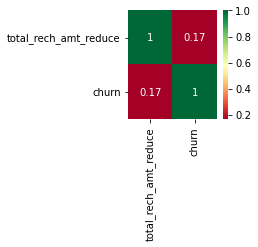

In [41]:
#checking how much the total_rech_amt_reduce column defines churn
plt.figure(figsize=[2,2])
sns.heatmap(hv_customers[["total_rech_amt_reduce", 'churn']].corr(), annot=True, cmap='RdYlGn')

In [42]:
#Dropping the total recharge columns
total_cols = ['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8']

hv_customers.drop(total_cols, axis=1, inplace=True)

In [43]:
hv_customers.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,tenure_buck_in_yrs,total_rech_amt_reduce
7,1069.18,1349.85,3171.48,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.00,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.00,0.18,10.01,4.50,0.00,6.50,0.00,0.00,0.00,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.00,0.00,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,1580,0,0,779,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,57.74,19.38,18.74,1,3,6,5,2.20,2_to_5,0
8,378.72,492.22,137.36,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.00,0.00,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.00,0.00,0.00,0.00,0.00,10.23,0.00,0.00,0.00,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,90,154,30,50,0,10,0.00,2.00,3.00,0.00,154.00,23.00,0.00,2.00,3.00,0.00,0.00,0.00,0.00,177.00,69.00,0.00,356.00,0.03,0.00,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,21.03,910.65,122.16,0,5,0,1,0.86,0_to_1,0
13,492.85,205.67,593.26,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.00,0.00,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.00,0.00,1.29,0.00,0.00,4.78,0.00,0.00,0.00,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.5

## 4. EDA

### 4.1 Univariate Analysis

#### 4.1.1 Categorical columns

In [44]:
#Checking all categorical columns
cat_cols = hv_customers.select_dtypes(include='category').columns
cat_cols

Index(['tenure_buck_in_yrs'], dtype='object')

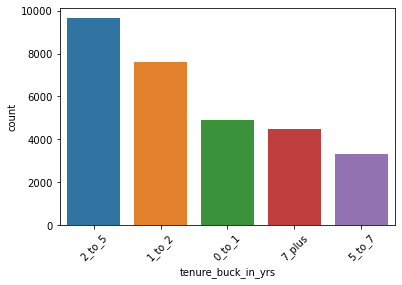

In [45]:
#Plotting the categorical columns
sns.countplot(data=hv_customers, x='tenure_buck_in_yrs', order=hv_customers['tenure_buck_in_yrs'].value_counts().index)
plt.xticks(rotation=45)
plt.show()

**`OBSERVATIONS:`**
- Most customers are in the tenure range 1 to 5 years.

#### 4.1.2 Integer columns

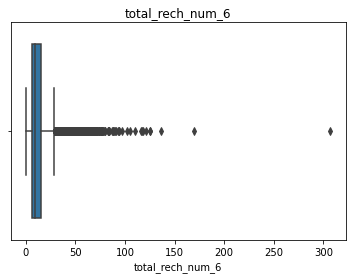

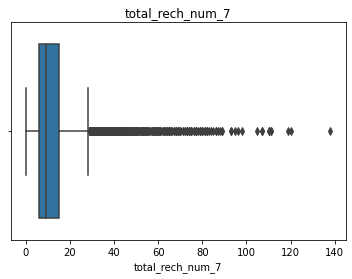

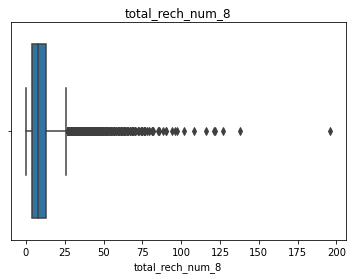

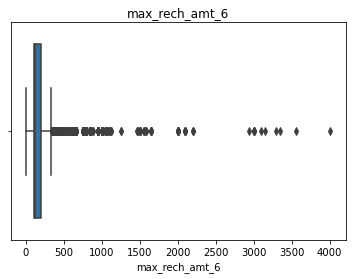

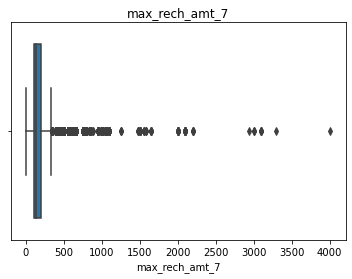

...

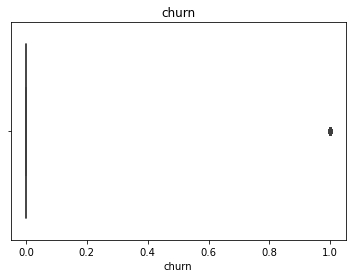

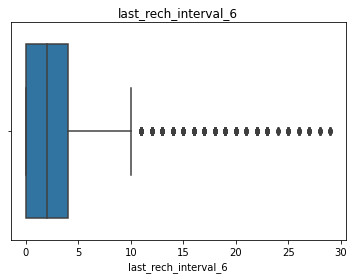

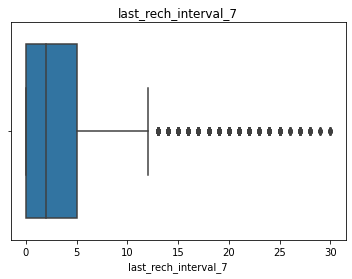

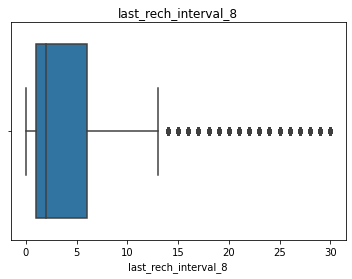

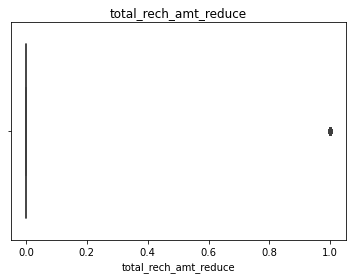

In [46]:
#Plotting all integer columns

int_cols = hv_customers.select_dtypes(include=['int64']).columns

for i in int_cols:
    sns.boxplot(data=hv_customers, x=i)
    plt.title(i)
    plt.show()

**`OBSERVATIONS:`**
- Most columns are having outliers

#### 4.1.3 Float columns

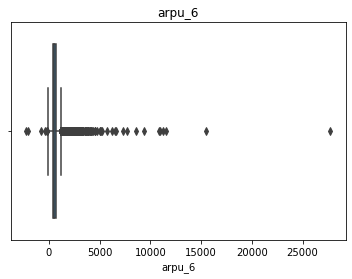

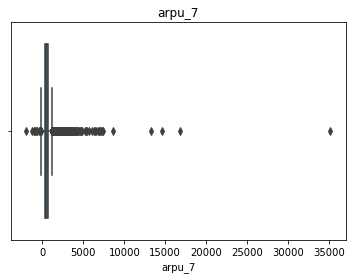

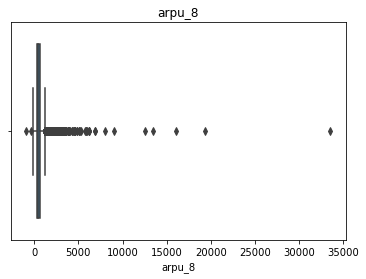

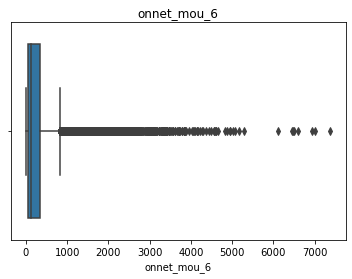

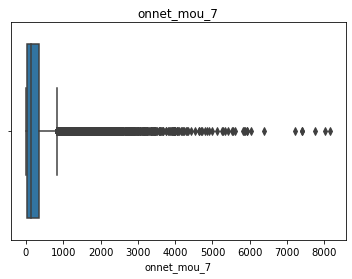

...

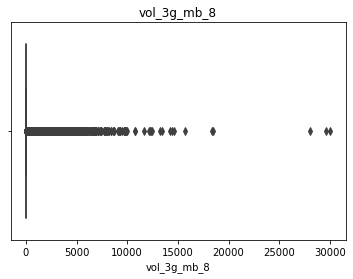

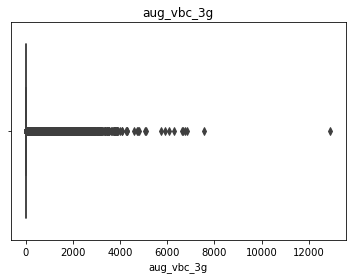

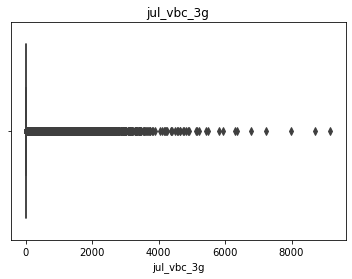

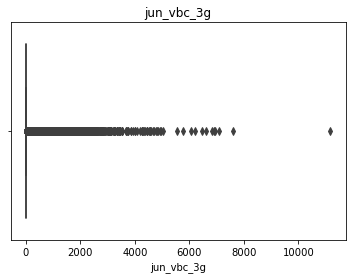

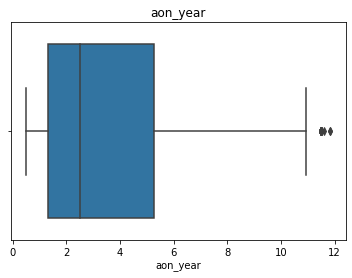

In [47]:
#Plotting all float columns
float_cols = hv_customers.select_dtypes(include=['float64']).columns

for i in float_cols:
    sns.boxplot(data=hv_customers, x=i)
    plt.title(i)
    plt.show()

**`OBSERVATIONS:`**
- Most columns are having outliers

### 4.2 Bivariate Analysis

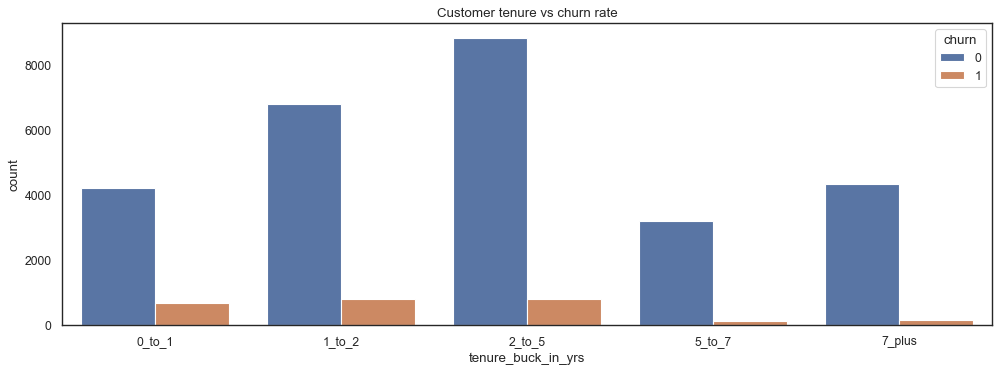

In [48]:
#Plotting the tenure w.r.t to Churn column

sns.set(style="white")
plt.figure(figsize=(15,5),edgecolor="k",facecolor="w",dpi=80)
sns.countplot(hv_customers['tenure_buck_in_yrs'],hue=hv_customers["churn"])
plt.title("Customer tenure vs churn rate")
plt.show()

**`OBSERVATIONS:`**
- It is observed that longer the tenure of the customer, lesser was the churn - as customers who are newly acquired to the network churned more as compared to the old customers.
- The churn rate of customers whose tenure is 5 and above is significantly low.

### 4.3 Multivariate Analysis

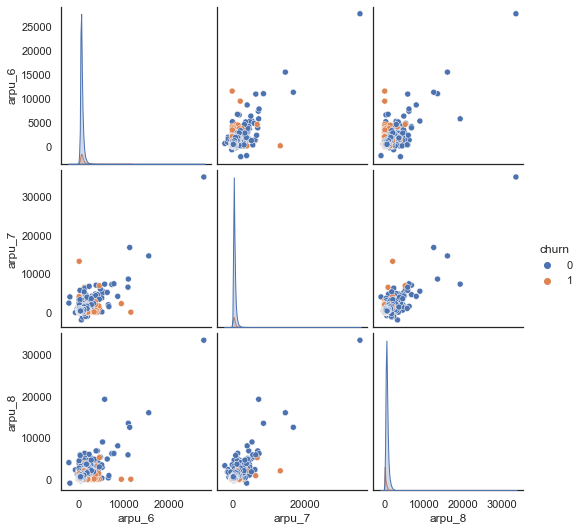

In [49]:
#Plotting scatter plots between arpu columns w.r.t Churn

sns.pairplot(hv_customers,vars = ['arpu_6', 'arpu_7', 'arpu_8'], hue = 'churn')
plt.show()

**`OBSERVATIONS`**:
- arpu_6, arpu_7 and arpu_8 columns are highly correlated with each other.

In [50]:
# Creating a averge of arpu 6,7 and 8 columns

hv_customers['avg_arpu_6_7_8'] = (hv_customers['arpu_6'] + hv_customers['arpu_7'] + hv_customers['arpu_8']) / 3
hv_customers.drop(['arpu_6', 'arpu_7', 'arpu_8'], axis=1, inplace=True)

#### onnet_mou (On network/ within the same network usage)

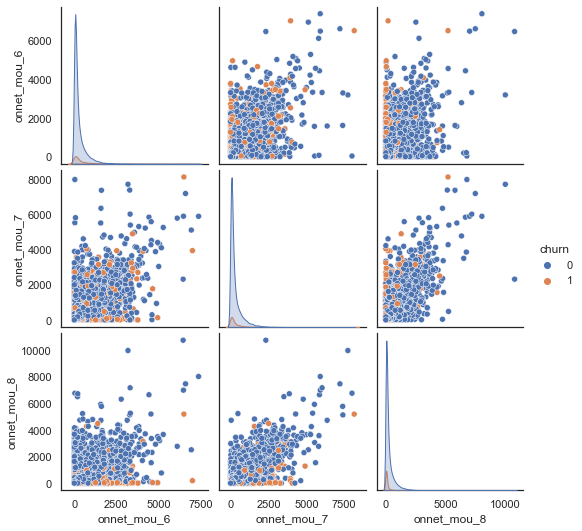

In [51]:
#Plotting scatter plots between onnet_mou columns w.r.t Churn

sns.pairplot(hv_customers,vars = ['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8'], hue = 'churn')
plt.show()

**`OBSERVATIONS`**:
- onnet_mou_7 and onnet_mou_8 seem to be correlated with good positive linear relationship.

#### offnet_mou (Calls outside of the operator network)

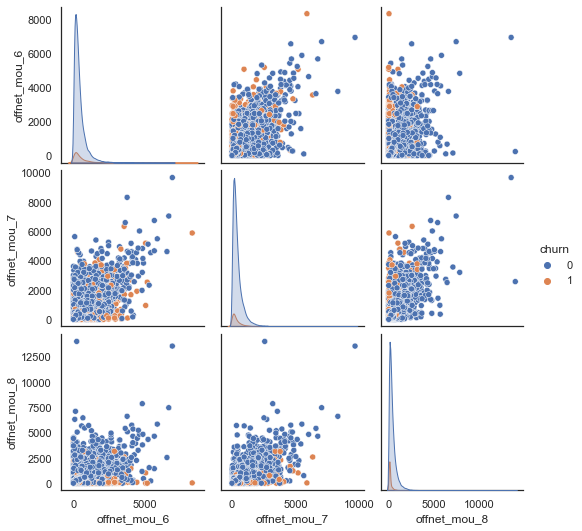

In [52]:
#Plotting scatter plots between offnet_mou columns w.r.t Churn
sns.pairplot(hv_customers,vars = ['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8'], hue = 'churn')
plt.show()

**`OBSERVATIONS`**:
- offet_mou_6 and offnet_mou_7 seem to be correlated with good positive linear relationship.

#### loc_og_mou (within the circle outgoing calls)

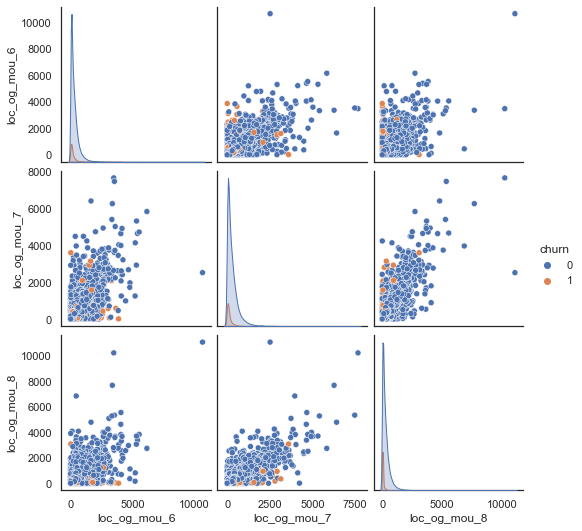

In [53]:
#Plotting scatter plots between loc_og_mou columns w.r.t Churn
sns.pairplot(hv_customers,vars = ['loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8'], hue = 'churn')
plt.show()

**`OBSERVATIONS`**:
- loc_og_mou_7 and loc_og_mou_8 seem to be correlated with good positive linear relationship.

#### std_og_mou (Outside calling circle/zone calls)

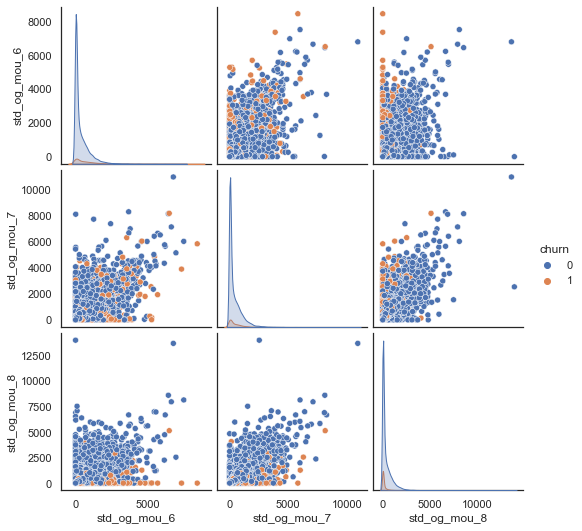

In [54]:
#Plotting scatter plots between std_og_mou columns w.r.t Churn
sns.pairplot(hv_customers,vars = ['std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8'], hue = 'churn')
plt.show()

**`OBSERVATIONS`**:
- std_og_mou_7 and std_og_mou_8 seem to be correlated with good positive linear relationship.

#### loc_ic_mou (incoming local calls)

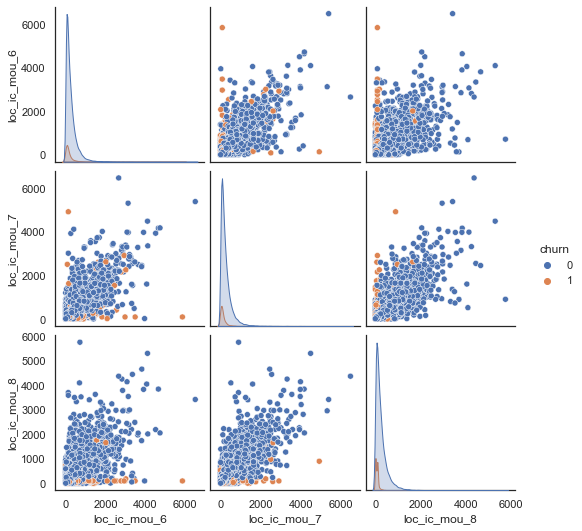

In [55]:
#Plotting scatter plots between loc_ic_mou columns w.r.t Churn
sns.pairplot(hv_customers,vars = ['loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8'], hue = 'churn')
plt.show()

**`OBSERVATIONS`**:
- loc_ic_mou_7 and loc_ic_mou_8 seem to be correlated with good positive linear relationship.

#### std_ic_mou (Outside circle incoming calls)

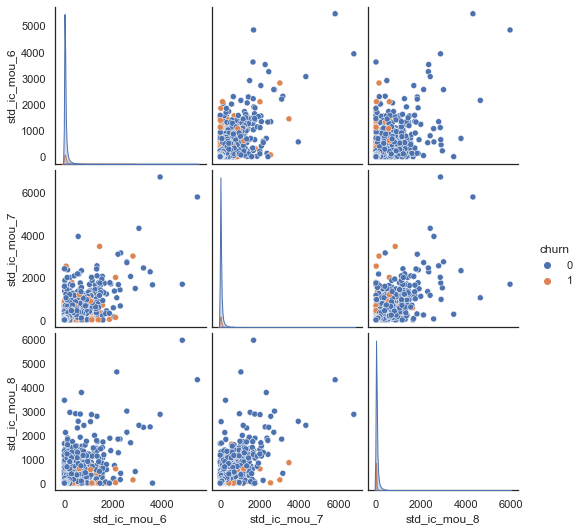

In [56]:
#Plotting scatter plots between loc_ic_mou columns w.r.t Churn
sns.pairplot(hv_customers,vars = ['std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8'], hue = 'churn')
plt.show()

<AxesSubplot:>

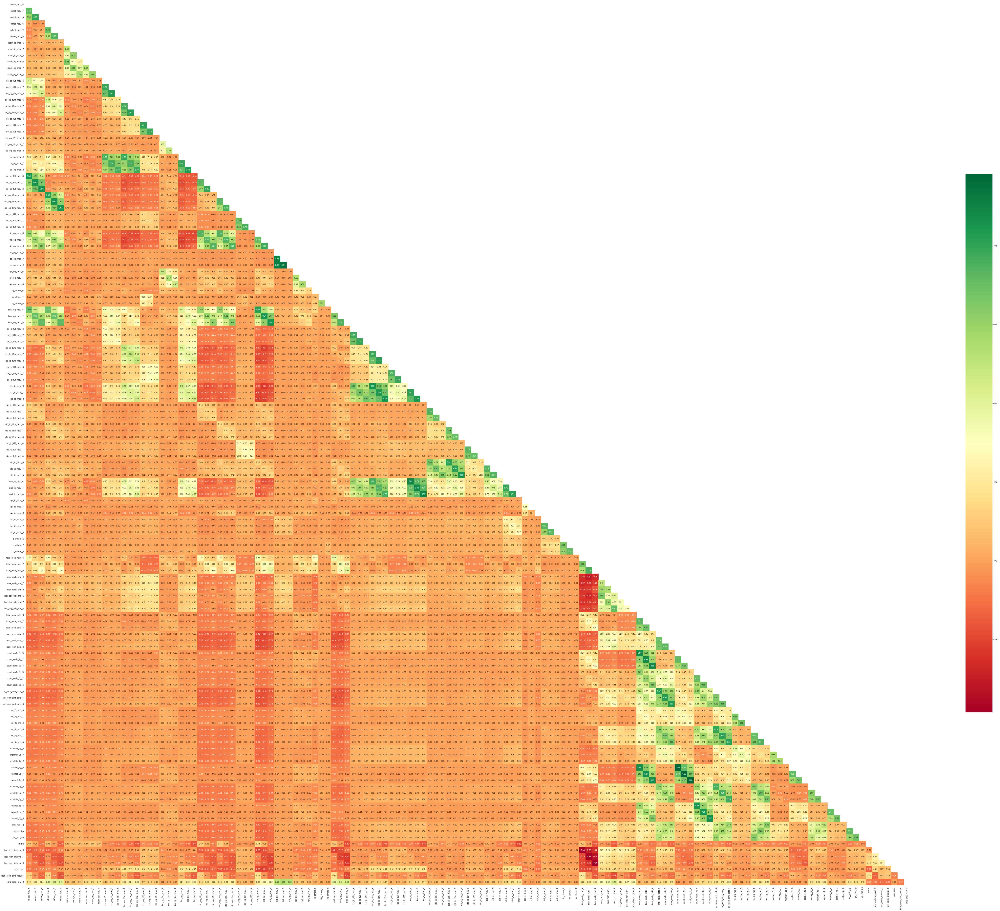

In [57]:
## Correlation Heatmap

corr_df = hv_customers.corr()
plt.figure(figsize=[100,100])
sns.heatmap(corr_df, annot=True, cmap='RdYlGn', fmt='.2f', annot_kws={'size': 10}, square=True, cbar_kws={"shrink": 0.5},
            mask=np.triu(np.ones(corr_df.shape)).astype(np.bool)[0:139,0:139])

In [58]:
#Checking top correlations

corr_matrix = hv_customers.corr()
corr_features = set()

corr_matrix.shape

(139, 139)

In [59]:
for i in range(139):
    corr_matrix.iloc[i,i] = 0

In [60]:
corr_matrix.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,total_rech_amt_reduce,avg_arpu_6_7_8
onnet_mou_6,0.00,0.72,0.59,0.01,-0.05,-0.04,0.01,0.01,0.03,0.05,0.06,0.06,0.44,0.33,0.29,-0.04,-0.07,-0.07,-0.06,-0.07,-0.07,0.05,0.03,0.04,0.25,0.17,0.14,0.85,0.60,0.49,0.04,-0.01,-0.00,-0.04,-0.04,-0.04,0.60,0.40,0.32,-0.02,-0.02,-0.02,0.09,0.06,0.06,0.09,-0.00,-0.00,0.69,0.46,0.36,0.08,0.07,0.05,-0.07,-0.09,-0.09,-0.05,-0.05,-0.05,-0.02,-0.04,-0.05,0.12,0.09,0.08,-0.01,-0.03,-0.03,-0.02,-0.02,-0.02,0.06,0.03,0.02,0.00,-0.03,-0.04,0.02,-0.03,-0.02,-0.03,-0.03,-0.03,-0.01,-0.01,-0.01,0.25,0.11,0.09,-0.03,-0.05,-0.04,-0.02,-0.04,-0.03,-0.08,-0.07,-0.07,-0.13,-0.14,-0.12,-0.05,-0.05,-0.05,-0.07,-0.06,-0.06,-0.12,-0.12,-0.11,-0.06,-0.06,-0.05,-0.08,-0.09,-0.08,-0.08,-0.09,-0.08,-0.04,-0.04,-0.03,-0.08,-0.08,-0.07,-0.03,-0.02,-0.03,-0.09,-0.09,-0.08,0.08,-0.15,-0.05,-0.06,-0.09,0.12,0.19
onnet_mou_7,0.72,0.00,0.79,-0.04,0.00,0.00,0.02,-0.01,0.02,0.06,0.05,0.07,0.32,0.45,0.36,-0.08,-0.06,-0.06,-0.07,-0.06,-0.07,0.03,0.06,0.06,0.15,0.25,0.19,0.61,0.85,0.68,0.01,0.04,0.04,-0.04,-0.03,-0.04,0.42,0.60,0.48,-0.02,-0.02,-0.02,0.05,0.11,0.10,0.04,-0.00,0.00,0.47,0.70,0.53,0.03,0.07,0.06,-0.11,-0.08,-0.08,-0.06,-0.04,-0.05,-0.07,-0.03,-0.04,0.08,0.12,0.11,-0.03,-0.01,-0.01,-0.02,-0.02,-0.02,0.02,0.05,0.04,-0.06,-0.01,-0.02,-0.00,-0.00,-0.03,-0.04,-0.03,-0.03,-0.01,-0.01,-0.01,0.13,0.24,0.19,-0.06,-0.03,-0.01,-0.02,-0.00,-0.01,-0.08,-0.06,-0.06,-0.14,-0.13,-0.12,-0.06,-0.04,-0.04,-0.07,-0.06,-0.06,-0.13,-0.12,-0.11,-0.07,-0.06,-0.05,-0.09,-0.09,-0.08,-0.09,-0.09,-0.07,-0.04,-0.02,-0.02,-0.08,-0.08,-0.07,-0.03,-0.03,-0.02,-0.08,-0.09,-0.09,0.01,-0.12,-0.14,-0.09,-0.10,-0.03,0.23
onnet_mou_8,0.59,0.79,0.00,-0.02,0.01,0.07,0.03,0.01,0.01,0.07,0.06,0.08,0.28,0.36,0.46,-0.05,-0.04,-0.00,-0.05,-0.05,-0.04,0.02,0.04,0.07,0.14,0.21,0.29,0.48,0.67,0.86,0.01,0.04,0.08,-0.03,-0.03,-0.03,0.33,0.48,0.62,-0.02,-0.02,-0.02,0.04,0.07,0.12,0.02,-0.00,-0.00,0.38,0.56,0.72,0.03,0.06,0.09,-0.09,-0.07,-0.04,-0.05,-0.03,-0.03,

In [61]:
#Checking columns correlated above 0.85

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i,j]) > 0.85:
            colname = corr_matrix.columns[i]
            corr_features.add(colname)

<AxesSubplot:>

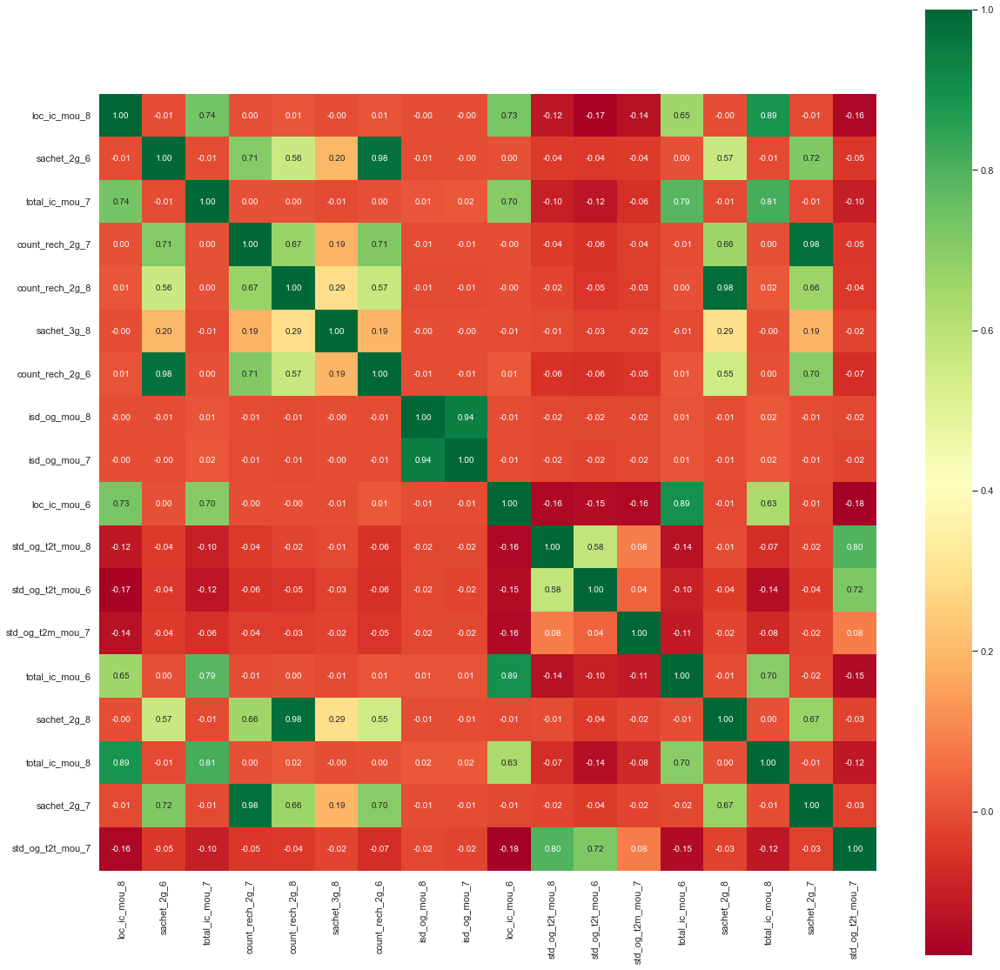

In [62]:
plt.figure(figsize=[20,40])
sns.heatmap(hv_customers[corr_features].corr(), annot=True, cmap='RdYlGn', fmt='.2f', annot_kws={'size': 10}, square=True, cbar_kws={"shrink": 0.5})

In [63]:
## Sachet 2g and count of recharge for 2g is highly correlated, dropping count_rech_2g cols

hv_customers.drop(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8'], axis=1, inplace=True)

In [64]:
# Dropping total_ic_mou cols as the data is already captured in loc_ic_mou cols

hv_customers.drop(['total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8'], axis=1, inplace=True)

## 5. Outlier Analysis and Treatment

In [65]:
hv_customers.describe(percentiles=[0.01, 0.10,.25,.5,.75,.90,.95,.99])

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,total_rech_amt_reduce,avg_arpu_6_7_8
count,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00
mean,296.40,304.67,268.61,418.95,424.85,377.90,17.41,13.52,13.26,29.32,22.04,21.47,94.81,95.85,87.51,181.71,181.68,168.85,6.98,7.10,6.49,1.57,1.86,1.71,283.63,284.75,263.23,189.75,199.88,172.20,203.14,213.45,179.67,2.01,2.03,1.79,394.99,415.44,353.88,2.26,2.21,2.03,5.92,7.43,6.89,0.69,0.05,0.06,686.70,709.12,623.77,68.91,70.47,66.44,160.21,161.39,155.45,15.60,16.52,14.74,244.94,248.58,237.21,16.23,16.89,15.05,32.04,33.50,30.50,2.87,2.99,2.68,51.19,53.43,48.35,0.07,0.02,0.03,11.16,12.36,11.70,1.19,1.48,1.24,12.12,11.91,10.23,171.41,175.66,162.87,104.49,105.29,95.65,0.94,1.05,1.04,56.91,58.68,55.26,0.31,0.34,0.31,90.73,97.55,89.76,78.86,78.17,69.21,258.39,278.09,269.86,0.12,0.13,0.11,0.50,0.59,0.61,0.17,0.19,0.17,0.14,0.15,0.14,129.44,135.13,121.36,0.09,3.17,3.48,4.01,3.46,0.23,570.43
std,460.56,481.59,466

In [66]:
## Performing Outlier Capping to treat outliers

cont_cols = [col for col in hv_customers.columns if col not in ['churn','tenure_buck_in_yrs','total_rech_amt_reduce', 'aon_year']]

for col in cont_cols:
    percentiles = hv_customers[col].quantile([0.01,0.99]).values
    hv_customers[col][hv_customers[col] <= percentiles[0]] = percentiles[0]
    hv_customers[col][hv_customers[col] >= percentiles[1]] = percentiles[1]

In [67]:
hv_customers.describe(percentiles=[0.01, 0.10,.25,.5,.75,.90,.95,.99])

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,total_rech_amt_reduce,avg_arpu_6_7_8
count,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00,30011.00
mean,287.72,295.37,259.34,411.16,416.27,367.96,14.80,10.63,10.59,25.56,18.60,17.58,86.73,86.68,79.03,176.23,176.87,164.39,6.28,6.40,5.89,1.33,1.54,1.47,276.05,276.75,256.09,181.94,191.60,164.02,195.01,204.93,169.87,1.49,1.45,1.28,385.81,405.64,343.16,0.79,0.80,0.55,5.31,6.62,6.02,0.63,0.00,0.00,677.23,698.38,612.91,63.02,63.99,60.40,154.89,155.99,150.27,14.13,14.88,13.29,238.39,241.81,230.97,12.95,13.65,12.14,28.23,29.31,26.40,2.10,2.20,1.94,46.17,48.25,43.17,0.06,0.01,0.03,8.30,9.05,8.50,0.71,0.91,0.75,11.98,11.78,10.09,168.84,172.59,159.96,100.31,101.44,91.67,0.88,1.00,0.97,55.07,56.67,53.57,0.27,0.30,0.28,86.39,93.17,86.05,71.43,70.42,61.65,234.31,254.37,246.91,0.12,0.13,0.11,0.46,0.54,0.57,0.17,0.17,0.16,0.10,0.10,0.09,120.43,126.04,112.18,0.09,3.13,3.44,3.99,3.46,0.23,561.84
std,404.73,419.60,399.55

In [68]:
## Checking columns that have no variance after replacement

cat_df = pd.DataFrame(hv_customers.nunique()).reset_index()
cat_df.columns=['Cols','uniques']
cat_df[cat_df['uniques'] == 1]

,Cols,uniques
46,og_others_7,1
47,og_others_8,1


In [69]:
#Dropping og_other_7 and og_other_8 due to 0 variance
hv_customers.drop(['og_others_7', 'og_others_8'], axis=1, inplace=True)

## 6. Data Preparation for Model Building

### 6.1 Creating dummy variables

In [70]:
hv_customers = pd.get_dummies(hv_customers, columns=cat_cols, drop_first=True)

In [71]:
hv_customers.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,total_rech_amt_reduce,avg_arpu_6_7_8,tenure_buck_in_yrs_1_to_2,tenure_buck_in_yrs_2_to_5,tenure_buck_in_yrs_5_to_7,tenure_buck_in_yrs_7_plus
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.00,0.00,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.00,0.18,10.01,4.50,0.00,6.50,0.00,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,0.21,0.00,0.00,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1000,790,951,0,0,619,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0.00,0,0,0,0,0,0,0,0,57.74,19.38,18.74,1,3,6,5,2.20,0,1811.54,0,1,0,0
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.00,0.00,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.00,0.00,0.00,0.00,0.00,10.23,0.00,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,90,154,30,50,0,10,0.00,2.00,3.00,0.00,154.00,23.00,0.00,0.00,0.00,0.00,177.00,69.00,0.00,356.00,0.03,0.00,750.95,11.94,0,1,0,0.00,1,3,0,0,0,0,0,0,21.03,910.65,122.16,0,5,0,1,0.86,0,336.10,0,0,0,0
13,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.00,0.00,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.00,0.00,1.29,0.00,0.00,4.78,0.00,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,0.45,0.00,0.00,239.60,62.11,249.89,20.71,16.24,21.44,6,4,11,110,110,130,110,50,0,0.00,0.00,3.00,0.00,0.00,23.00,0.00,0.00,0.0

### 6.2 Train-Test Split

In [72]:
y = hv_customers['churn']
X = hv_customers.drop('churn', axis=1)

In [73]:
### Splitting data into Train and Test sets (70-30)

X_train, X_test, y_train, y_test = train_test_split(X,y, train_size = 0.7, test_size = 0.3, random_state =100, stratify=y,
                                                   shuffle=True)

print("Training dataset size:",X_train.shape)
print("Training dataset target size:",y_train.shape)
print("Test dataset size:",X_test.shape)
print("Test dataset target size:",y_test.shape)

Training dataset size: (21007, 134)
Training dataset target size: (21007,)
Test dataset size: (9004, 134)
Test dataset target size: (9004,)


### 6.3 Scaling the data

In [74]:
X_train.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,total_rech_amt_reduce,avg_arpu_6_7_8,tenure_buck_in_yrs_1_to_2,tenure_buck_in_yrs_2_to_5,tenure_buck_in_yrs_5_to_7,tenure_buck_in_yrs_7_plus
76985,450.01,1055.96,623.81,197.73,155.16,165.36,0.00,0.00,201.81,0.00,0.00,432.74,35.94,7.66,4.03,94.49,30.78,2.46,0.00,0.00,0.00,7.14,28.24,0.91,130.44,38.44,6.49,414.06,1048.29,121.28,79.86,77.79,26.93,0.00,0.00,0.00,493.93,1126.09,148.21,0.00,0.00,0.00,23.36,65.68,8.48,0.00,647.74,1230.23,163.19,8.78,1.96,0.70,24.73,39.89,13.69,0.00,0.00,0.00,33.51,41.86,14.39,19.96,45.88,22.94,17.01,96.59,27.28,1.44,0.00,0.00,38.43,142.48,50.23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5,9,8,198,128,229,128,128,150,1.00,1.00,1.00,198.00,8.00,198.00,0.00,0.00,0.00,198.00,8.00,198.00,0.00,0.00,18.35,1317.53,67.11,295.95,1,0,1,0.00,1,0,0,0,0,0,0,0,294.22,0.00,0.00,7,1,6,0.52,0,491.29,0,0,0,0
77814,1327.49,1330.71,1111.66,164.59,204.28,130.48,0.00,0.00,0.00,0.00,0.00,0.00,188.68,212.09,176.86,58.19,97.08,50.79,0.65,0.13,0.00,0.00,0.00,0.00,247.53,309.31,227.66,1138.81,1118.61,934.79,105.74,103.73,79.68,0.00,0.00,0.00,1244.56,1222.34,1014.48,0.00,0.00,0.00,2.58,7.19,4.78,3.14,1497.83,1538.86,1246.93,88.98,105.58,93.84,55.54,72.89,53.21,1.03,0.00,0.00,145.56,178.48,147.06,8.51,9.69,32.49,4.61,0.58,1.25,0.00,0.00,0.00,13.13,10.28,33.74,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19,18,16,110,110,144,110,110,50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0.00,0,0,0,0,0,0,0,0,0.00,0.00,0.00,2,4,1,1.24,0,760.57,1,0,0,0
24787,176.81,151.86,116.99,248.23,237.76,174.74,11.26,0.00,0.00,11.79,0.00,0.00,166.96,151.86,116.99,236.08,212.78,166.66,1.21,4.61,1.11,0.20,2.46,0.03,404.26,369.26,284.78,0.00,0.00,0.00,7.43,0.00,6.79,1.35,0.00,0.00,8.78,0.00,6.79,0.00,0.00,0.00,0.20,20.36,0.84,0.00,413.24,389.63,292.43,79.44,170.19,82.24,317.68,277.73,280.24,7.76,0.00,7.44,404.89,447.93,369.94,0.00,0.00,0.00,7.11,5.64,18.24,5.31,4.61,6.46,12.43,10.26,24.71,0.00,0.00,0.00,0.00,7.83,11.16,0.00,0.00,0.00,4,3,3,279,279,339,279,0,250,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,

In [75]:
#Using StandardScaler 

scaler = StandardScaler()

cols = X_train.select_dtypes(include=['int64', 'float64']).columns
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.transform(X_test[cols])

In [76]:
X_train.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,last_rech_interval_6,last_rech_interval_7,last_rech_interval_8,aon_year,total_rech_amt_reduce,avg_arpu_6_7_8,tenure_buck_in_yrs_1_to_2,tenure_buck_in_yrs_2_to_5,tenure_buck_in_yrs_5_to_7,tenure_buck_in_yrs_7_plus
76985,0.41,1.83,0.91,-0.51,-0.61,-0.50,-0.29,-0.26,4.75,-0.31,-0.28,6.68,-0.32,-0.50,-0.52,-0.39,-0.70,-0.79,-0.43,-0.44,-0.42,1.48,6.02,-0.13,-0.45,-0.75,-0.80,0.66,2.31,-0.12,-0.32,-0.33,-0.43,-0.25,-0.24,-0.24,0.20,1.25,-0.36,-0.17,-0.17,-0.15,1.58,4.50,0.20,-0.39,-0.04,0.86,-0.72,-0.55,-0.62,-0.62,-0.71,-0.65,-0.77,-0.45,-0.45,-0.45,-0.77,-0.75,-0.82,0.22,0.98,0.35,-0.19,1.10,0.02,-0.09,-0.28,-0.28,-0.09,1.01,0.08,-0.44,-0.20,-0.26,-0.26,-0.27,-0.26,-0.26,-0.27,-0.26,-0.81,-0.31,-0.24,0.18,-0.29,0.48,0.24,0.23,0.52,0.08,0.00,0.02,1.51,-0.51,1.53,-0.38,-0.37,-0.36,0.71,-0.51,0.69,-0.34,-0.33,-0.22,1.77,-0.29,0.07,2.41,-0.34,2.56,-0.33,0.29,-0.37,-0.33,-0.33,-0.33,-0.23,-0.23,-0.22,0.55,-0.37,-0.36,0.93,-0.58,0.40,-1.10,-0.55,-0.24,0,0,0,0
77814,2.59,2.48,2.13,-0.59,-0.49,-0.59,-0.29,-0.26,-0.26,-0.31,-0.28,-0.28,0.64,0.80,0.68,-0.56,-0.38,-0.55,-0.38,-0.43,-0.42,-0.33,-0.34,-0.33,-0.09,0.10,-0.09,2.70,2.50,2.18,-0.25,-0.27,-0.27,-0.25,-0.24,-0.24,1.56,1.41,1.22,-0.17,-0.17,-0.15,-0.23,0.05,-0.10,1.56,1.36,1.35,1.02,0.27,0.42,0.35,-0.54,-0.46,-0.55,-0.42,-0.45,-0.45,-0.35,-0.24,-0.32,-0.14,-0.11,0.65,-0.40,-0.47,-0.45,-0.28,-0.28,-0.28,-0.37,-0.41,-0.11,-0.44,-0.20,-0.26,-0.26,-0.27,-0.26,-0.26,-0.27,-0.26,0.83,0.72,0.69,-0.39,-0.40,-0.11,0.08,0.07,-0.38,-0.51,-0.51,-0.53,-0.58,-0.59,-0.57,-0.38,-0.37,-0.36,-0.55,-0.55,-0.54,-0.34,-0.33,-0.32,-0.38,-0.39,-0.38,-0.33,-0.34,-0.32,-0.33,-0.35,-0.37,-0.33,-0.33,-0.33,-0.23,-0.23,-0.22,-0.38,-0.37,-0.36,-0.29,0.13,-0.60,-0.83,-0.55,0.68,1,0,0,0
24787,-0.27,-0.34,-0.35,-0.39,-0.41,-0.48,-0.07,-0.26,-0.26,-0.17,-0.28,-0.28,0.50,0.42,0.26,0.28,0.17,0.01,-0.35,-0.13,-0.35,-0.28,0.21,-0.33,0.39,0.29,0.09,-0.51,-0.51,-0.46,-0.52,-0.54,-0.49,-0.02,-0.24,-0.24,-0.68,-0.69,-0.61,-0.17,-0.17,-0.15,-0.44,1.05,-0.42,-0.39,-0.43,-0.49,-0.52,0.17,1.08,0.23,0.89,0.68,0.73,-0.21,-0.45,-0.20,0.63,0.77,0.53,-0.41,-0.41,-0.39,-0.36,-0.39,-0.14,0.44,0.30,0.65,-0.38,-0.41,-0.22,-0.44,

In [77]:
#Handling target column's data imbalance by adding synthetically generated points for minority class i.e., Churn = 1

smo = SMOTE(random_state=100, sampling_strategy='minority')

X_train_smo, y_train_smo = smo.fit_resample(X_train, y_train)

In [78]:
y_train.value_counts()

0    19192
1     1815
Name: churn, dtype: int64

In [79]:
# Converting to pandas DF
X_train_smo = pd.DataFrame(X_train_smo)
y_train_smo = pd.DataFrame(y_train_smo)

In [80]:
y_train_smo.value_counts()

churn
1        19192
0        19192
dtype: int64

## 7. Performing PCA

### 7.1 PCA for Original Dataset with Class Imbalance

In [81]:
#PCA for X_train

pca = PCA(random_state=100)

pca.fit(X_train)

PCA(random_state=100)

In [82]:
print(pca.components_)

[[-8.95053919e-02 -9.60061886e-02 -8.27886676e-02 ... -4.61746507e-03
   8.11875741e-03  1.63917017e-02]
 [ 4.97560620e-02  5.62137434e-02  6.40193109e-02 ... -2.16568464e-03
   8.81530365e-03  1.80827448e-02]
 [ 1.24897660e-01  1.58717611e-01  1.64596317e-01 ...  4.44043465e-03
  -8.65522903e-03 -1.93620179e-02]
 ...
 [ 2.66548741e-02 -2.99838186e-01  2.18818034e-01 ... -4.37996403e-03
  -7.01495739e-03 -1.10409370e-02]
 [ 1.56362497e-01 -3.85864866e-02 -1.31835661e-01 ... -3.96550202e-06
   3.83619028e-04  2.56541760e-03]
 [-6.42840893e-02  1.99732615e-01 -1.29194291e-01 ...  1.75582193e-03
   1.72869026e-03  3.25625418e-03]]


In [83]:
print(pca.explained_variance_ratio_)

[1.14331014e-01 8.75547303e-02 7.03614051e-02 5.16886933e-02
 4.17481514e-02 3.53920811e-02 2.80877662e-02 2.70054912e-02
 2.54388872e-02 2.41811414e-02 2.25229218e-02 2.16124600e-02
 2.02521613e-02 1.83835823e-02 1.76021034e-02 1.57269656e-02
 1.54369034e-02 1.36671382e-02 1.25972091e-02 1.14309456e-02
 1.09535930e-02 1.08250594e-02 1.04362249e-02 1.02840887e-02
 9.34615381e-03 8.70088450e-03 8.44353980e-03 8.03545223e-03
 7.97735281e-03 7.46000264e-03 7.09359999e-03 7.05109306e-03
 6.90188386e-03 6.80635231e-03 6.71896462e-03 6.42759744e-03
 6.31884941e-03 6.12209384e-03 6.05295924e-03 5.83340903e-03
 5.64129495e-03 5.55078216e-03 5.39216869e-03 5.34762287e-03
 5.15768849e-03 5.04200199e-03 4.92143308e-03 4.90507263e-03
 4.70865388e-03 4.53423721e-03 4.30437736e-03 4.20780465e-03
 4.17250245e-03 3.99050872e-03 3.77528280e-03 3.58476958e-03
 3.49005009e-03 3.25244330e-03 2.96138486e-03 2.89414829e-03
 2.85291109e-03 2.79555072e-03 2.71645432e-03 2.62841802e-03
 2.61110893e-03 2.499405

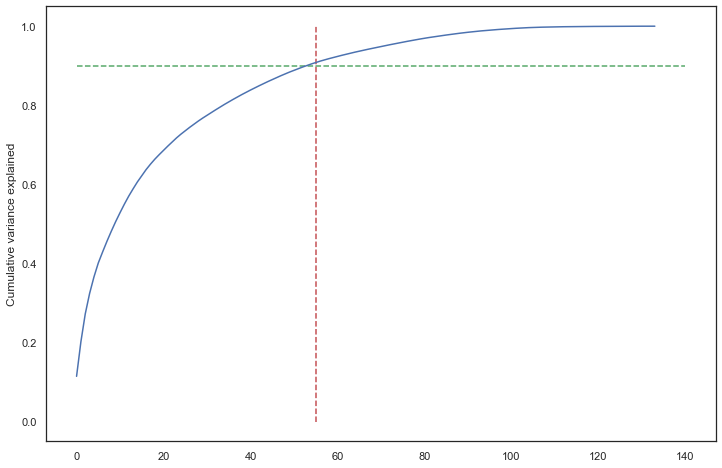

In [84]:
# Making a scree plot for the explained variance

var_cumu = np.cumsum(pca.explained_variance_ratio_)

fig = plt.figure(figsize=[12,8])
plt.vlines(x=55, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.90, xmax=140, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

- Around 90% of the data is explained using 55 variables

In [85]:
final_pca = PCA(n_components=55, random_state=100)

X_train_pca = final_pca.fit_transform(X_train)
X_test_pca = final_pca.transform(X_test)

In [86]:
X_train_pca.shape , X_test_pca.shape

((21007, 55), (9004, 55))

In [87]:
X_train_pca = pd.DataFrame(X_train_pca)
X_train_pca.columns = ['PC'+str(i) for i in range(1,56)]
X_test_pca = pd.DataFrame(X_test_pca)
X_test_pca.columns = ['PC'+str(i) for i in range(1,56)]
X_train_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55
0,-1.09,-2.75,2.40,1.72,-0.45,2.42,2.19,1.82,-1.38,0.57,2.63,-3.07,4.17,-1.78,-0.75,-0.55,-0.95,0.40,-0.15,-0.80,-2.00,-2.32,-1.29,-0.92,-4.41,2.91,3.61,0.73,1.03,1.38,-1.54,-1.78,-1.14,1.71,-0.03,2.94,-1.77,0.66,-0.88,0.53,-0.85,0.65,-1.04,-1.28,-1.73,1.38,1.27,0.96,-0.64,-0.57,-0.88,-0.67,-3.01,-0.18,0.06
1,-4.79,0.67,2.83,-1.26,-3.07,4.28,-0.75,-0.11,0.09,-0.11,0.20,0.21,-0.81,0.27,0.50,0.66,-0.08,0.13,-0.24,0.19,0.01,0.18,-0.13,-0.62,-0.05,-0.30,-0.37,-0.75,0.62,-0.24,0.37,-0.63,-0.52,-0.26,0.21,0.21,0.22,0.48,0.26,0.42,-0.31,-0.09,-0.19,-0.30,0.01,-0.16,-0.39,-0.26,0.48,-0.63,-0.01,-0.08,0.11,-0.17,-0.02
2,1.20,1.53,-3.02,0.57,-1.29,0.33,0.24,-0.58,0.09,-0.05,-0.46,0.34,0.61,-0.06,-0.52,0.45,-1.78,-0.58,0.38,-1.02,-0.97,0.42,-0.50,0.30,-0.28,-0.12,0.38,-0.86,0.32,-0.33,1.57,-1.11,1.43,0.05,-0.63,0.82,-1.20,-0.28,0.04,-0.05,-0.84,0.38,-0.17,-0.26,0.21,-0.01,0.00,0.08,0.08,0.52,0.07,0.01,0.57,-0.04,0.49
3,8.67,-10.07,6.05,-8.86,5.82,-0.42,-0.43,2.65,4.50,-5.74,-0.86,3.11,-4.00,0.39,-1.62,-1.62,-1.26,4.95,0.15,-1.33,-2.39,1.39,-1.16,0.65,0.44,0.11,1.00,-0.13,-0.15,-0.33,0.32,-0.74,1.15,0.21,0.55,-0.83,-0.01,-0.09,-0.74,-0.74,-0.30,-0.42,0.17,0.24,-0.39,0.70,-0.01,0.32,-0.90,-0.25,-0.12,-0.14,0.46,-0.45,0.21
4,-1.48,1.45,1.04,6.56,6.26,3.44,2.00,-3.39,0.74,0.14,-1.89,2.01,0.51,-5.98,0.34,0.12,0.80,0.97,-0.05,2.45,-1.50,-1.06,3.03,6.20,0.22,-0.37,-0.03,0.53,0.32,0.15,0.66,0.03,-0.82,-0.32,1.02,0.99,-0.24,0.19,-0.41,0.94,-0.42,1.02,-0.05,-0.11,-0.17,-0.11,0.56,0.15,0.51,0.08,0.29,-0.45,-0.05,-0.69,0.32


### 7.2 PCA for SMOTE dataset (Class Balanced)

In [88]:
pca_smo = PCA(random_state=100)

pca_smo.fit(X_train_smo)

PCA(random_state=100)

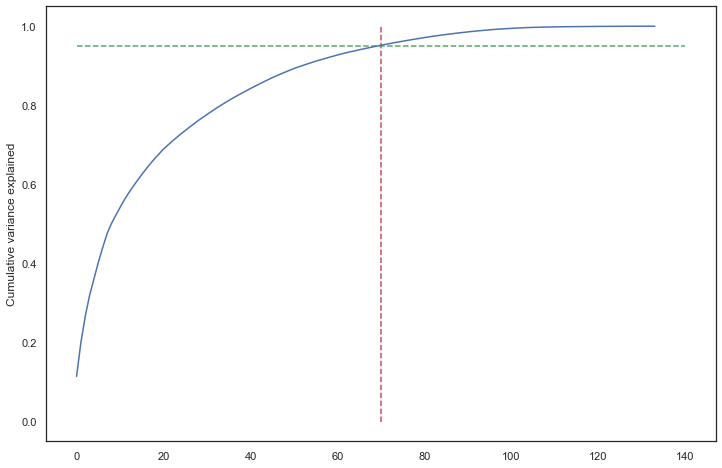

In [89]:
# Making a scree plot for the explained variance

var_cumu = np.cumsum(pca_smo.explained_variance_ratio_)

fig = plt.figure(figsize=[12,8])
plt.vlines(x=70, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=140, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [90]:
final_pca_smo = PCA(n_components=70, random_state=100)

X_train_pca_smo = final_pca_smo.fit_transform(X_train_smo)
X_test_pca_smo = final_pca_smo.transform(X_test)

In [91]:
X_train_pca_smo = pd.DataFrame(X_train_pca_smo)
X_train_pca_smo.columns = ['PC'+str(i) for i in range(1,71)]
X_test_pca_smo = pd.DataFrame(X_test_pca_smo)
X_test_pca_smo.columns = ['PC'+str(i) for i in range(1,71)]
X_train_pca_smo.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70
0,-0.58,-0.11,3.58,3.46,-2.65,0.12,0.53,-0.23,0.04,0.61,4.22,-3.80,2.77,3.04,1.58,-4.00,0.99,-1.60,-2.32,-0.18,0.69,3.01,-0.89,-2.19,-0.08,0.30,-0.97,-1.50,0.55,-0.54,1.37,1.02,-0.33,-1.74,-2.63,-1.23,1.88,-1.03,0.99,-0.24,-1.01,-3.24,-0.73,2.00,0.42,0.80,-0.43,-0.26,0.47,0.11,-0.40,-0.94,-0.81,1.45,-1.08,1.16,0.17,-0.64,-0.07,0.30,1.32,-0.32,-0.71,-0.02,0.01,-0.40,0.56,0.47,0.33,-0.38
1,-3.71,3.52,1.98,-0.86,-4.55,-2.23,-1.13,-0.16,0.22,-0.22,-0.75,0.11,-0.14,-0.09,0.07,0.61,-0.79,0.17,-0.47,-0.28,-0.01,-0.42,0.30,0.25,-0.29,-0.16,-0.81,0.51,1.17,-0.71,0.02,0.20,-0.28,-0.26,0.32,0.21,0.24,0.39,0.03,0.22,-0.18,-0.08,0.28,-0.06,-0.15,-0.16,-0.15,-0.12,0.02,-0.16,-0.44,-0.12,0.02,-0.11,-0.01,-0.10,0.18,-0.00,0.11,-0.10,-0.56,0.32,0.02,0.20,0.20,0.11,-0.26,0.09,-0.08,-0.03
2,2.46,0.33,-3.12,0.06,-0.31,-1.21,-1.04,-0.75,-0.53,-0.23,0.19,0.01,0.77,-0.15,0.60,-0.48,-0.02,0.62,-0.09,-1.60,-0.43,0.49,0.24,-0.36,-1.11,0.33,0.24,-1.30,0.63,-0.28,0.71,0.26,-0.64,-0.00,-0.15,-0.92,0.89,-0.08,0.02,1.50,-0.47,0.93,1.19,-0.42,0.42,0.58,0.68,0.32,-0.24,0.47,0.34,0.15,0.70,-0.10,0.37,0.24,0.20,0.15,0.15,0.23,-0.40,-0.48,-0.24,-0.01,0.38,-0.10,0.59,-0.37,-0.51,0.39
3,8.62,-4.27,11.28,-5.89,-1.88,8.71,2.65,1.22,2.06,-0.04,-0.95,8.85,-0.46,0.49,0.24,-0.13,0.63,2.32,0.87,-0.32,4.10,1.64,-0.85,-1.34,0.08,0.78,-1.05,-2.45,0.04,-0.07,0.44,0.65,-0.09,1.72,-0.10,0.46,-0.23,-0.06,0.77,-0.19,0.24,1.47,1.33,1.44,0.89,0.00,-0.13,-0.24,0.02,0.24,-0.08,-0.13,0.10,-0.35,1.05,-0.50,-0.14,-0.79,-0.58,-0.47,-0.34,-0.24,-0.18,0.05,0.09,-0.66,0.43,0.82,1.04,0.51
4,0.08,2.14,-0.94,3.59,0.50,-2.33,9.18,0.11,-3.84,-2.36,-1.93,0.57,2.18,-2.34,-3.28,-3.25,0.63,-0.54,0.41,1.12,0.74,0.38,-5.83,3.07,-1.42,1.42,1.32,0.50,-0.09,-0.11,0.07,1.04,-0.13,-1.23,-0.73,0.83,1.36,0.33,-0.39,1.16,-0.26,-1.00,0.17,-0.01,-0.50,-1.15,-0.22,-0.10,-0.05,0.35,0.18,-0.51,-0.06,-0.14,0.69,0.21,0.25,-0.12,0.28,-0.01,0.05,0.32,-0.30,0.28,0.50,0.09,-0.37,0.21,-0.06,-0.13


## 8. MODEL BUILDING

### Model 1 - Logistic Regression with PCA and class_weight parameter

In [92]:
linear_pca = LogisticRegressionCV(cv=5, n_jobs=-1, verbose=True, scoring='roc_auc', random_state=100,
                                  class_weight='balanced')

model_lr_pca = linear_pca.fit(X_train_pca, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    3.8s remaining:    5.8s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.9s finished


In [93]:
# For evaluating let's define a function which can be re-used
def evaluate_pca_model(classifier, X_train, y_train, X_test):
    print("Train Accuracy :", round(accuracy_score(y_train, classifier.predict(X_train)), 2))
    print("Train ROC AUC Score :", round(roc_auc_score(y_train, classifier.predict_proba(X_train)[:,1]),2))
    con_matrix = confusion_matrix(y_train, classifier.predict(X_train))
    sensitivity=con_matrix[1,1]/(con_matrix[1,0]+con_matrix[1,1])
    specificity=con_matrix[0,0]/(con_matrix[0,0]+con_matrix[0,1])
    print("Train Confusion Matrix:")
    print(con_matrix)
    print("Train Sensitivity :", round(sensitivity, 2))
    print("Train Specificity :", round(sensitivity, 2))
    print("Train Classification Report:")
    print(classification_report(y_train, classifier.predict(X_train)))
    
    print("-"*75)
    
    print("Test Accuracy :", round(accuracy_score(y_test, classifier.predict(X_test)),2))
    print("Test ROC AUC Score :", round(roc_auc_score(y_test, classifier.predict_proba(X_test)[:,1]),2))
    con_matrix = confusion_matrix(y_test, classifier.predict(X_test))
    sensitivity=con_matrix[1,1]/(con_matrix[1,0]+con_matrix[1,1])
    specificity=con_matrix[0,0]/(con_matrix[0,0]+con_matrix[0,1])
    print("Test Confusion Matrix:")
    print(con_matrix)
    print("Test Sensitivity :", round(sensitivity, 2))
    print("Test Specificity :", round(sensitivity, 2))
    print("Test Classification Report:")
    print(classification_report(y_test, classifier.predict(X_test)))

In [94]:
evaluate_pca_model(model_lr_pca, X_train_pca, y_train, X_test_pca)

Train Accuracy : 0.83
Train ROC AUC Score : 0.9
Train Confusion Matrix:
[[15846  3346]
 [  288  1527]]
Train Sensitivity : 0.84
Train Specificity : 0.84
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.83      0.90     19192
           1       0.31      0.84      0.46      1815

    accuracy                           0.83     21007
   macro avg       0.65      0.83      0.68     21007
weighted avg       0.92      0.83      0.86     21007

---------------------------------------------------------------------------
Test Accuracy : 0.82
Test ROC AUC Score : 0.89
Test Confusion Matrix:
[[6759 1467]
 [ 121  657]]
Test Sensitivity : 0.84
Test Specificity : 0.84
Test Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.82      0.89      8226
           1       0.31      0.84      0.45       778

    accuracy                           0.82      9004
   macro avg       0.65 

**`OBSERVATIONS:`**

- The model performance is good as the Train Metrics and the Test Metrics are very close, and Sensitivity is also 0.84, indicating that it is able to identify 84% of the customers planning to Churn

### Model 2 - Logistic Regression with PCA and SMOTE balanced Dataset

In [95]:
linear_pca_smo = LogisticRegressionCV(cv=5, n_jobs=-1, verbose=True, scoring='roc_auc', random_state=100)

model_lr_pca_smo = linear_pca_smo.fit(X_train_pca_smo, y_train_smo)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    1.7s remaining:    2.5s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    3.5s finished


In [96]:
evaluate_pca_model(model_lr_pca_smo, X_train_pca_smo, y_train_smo, X_test_pca_smo)

Train Accuracy : 0.86
Train ROC AUC Score : 0.92
Train Confusion Matrix:
[[16058  3134]
 [ 2420 16772]]
Train Sensitivity : 0.87
Train Specificity : 0.87
Train Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.84      0.85     19192
           1       0.84      0.87      0.86     19192

    accuracy                           0.86     38384
   macro avg       0.86      0.86      0.86     38384
weighted avg       0.86      0.86      0.86     38384

---------------------------------------------------------------------------
Test Accuracy : 0.83
Test ROC AUC Score : 0.88
Test Confusion Matrix:
[[6861 1365]
 [ 140  638]]
Test Sensitivity : 0.82
Test Specificity : 0.82
Test Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.83      0.90      8226
           1       0.32      0.82      0.46       778

    accuracy                           0.83      9004
   macro avg       0.65

**`OBSERVATIONS:`**

- The model performance is good with the Train Metrics and the Test Metrics differing by 0.4, and Sensitivity is also 0.82, indicating that it is able to identify 82% of the customers planning to Churn

### Model 3 - Random Forests with PCA and class_weight parameter

In [97]:
forest = RandomForestClassifier(random_state=100)

forest_model = forest.fit(X_train_pca, y_train)

In [98]:
evaluate_pca_model(forest_model, X_train_pca, y_train, X_test_pca)

Train Accuracy : 1.0
Train ROC AUC Score : 1.0
Train Confusion Matrix:
[[19192     0]
 [    1  1814]]
Train Sensitivity : 1.0
Train Specificity : 1.0
Train Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     19192
           1       1.00      1.00      1.00      1815

    accuracy                           1.00     21007
   macro avg       1.00      1.00      1.00     21007
weighted avg       1.00      1.00      1.00     21007

---------------------------------------------------------------------------
Test Accuracy : 0.92
Test ROC AUC Score : 0.88
Test Confusion Matrix:
[[8167   59]
 [ 681   97]]
Test Sensitivity : 0.12
Test Specificity : 0.12
Test Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.96      8226
           1       0.62      0.12      0.21       778

    accuracy                           0.92      9004
   macro avg       0.77    

- We can see that our initial model is giving 100% of accuracy on train data and 92% on test, but sensitivity and specificity is very low.
- There is a overfitting in the model.


#### **Hyperparameter Tuning**

In [99]:
rf = RandomForestClassifier(random_state=100, n_jobs=-1, oob_score=True, class_weight='balanced')

params = {
    
    'max_depth': [5, 10, 15, 20],
    'min_samples_leaf': [10, 20, 50, 100],
    'max_features': [2,4,6],
    'n_estimators': [10, 25, 50]
}

scorer = make_scorer(roc_auc_score, greater_is_better=True)

In [100]:
## Using GridSearchCV to fit and check

gridsearchcv = GridSearchCV(estimator=rf , param_grid=params, scoring=scorer, n_jobs=-1, 
                            verbose=True, return_train_score=True, cv=4)

gridsearchcv.fit(X_train_pca, y_train)

Fitting 4 folds for each of 144 candidates, totalling 576 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 576 out of 576 | elapsed:  3.8min finished


GridSearchCV(cv=4,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              n_jobs=-1, oob_score=True,
                                              random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [5, 10, 15, 20],
                         'max_features': [2, 4, 6],
                         'min_samples_leaf': [10, 20, 50, 100],
                         'n_estimators': [10, 25, 50]},
             return_train_score=True, scoring=make_scorer(roc_auc_score),
             verbose=True)

In [101]:
#Checking best parameters
gridsearchcv.best_params_

{'max_depth': 15,
 'max_features': 6,
 'min_samples_leaf': 100,
 'n_estimators': 50}

In [102]:
#Checking best estimator
gridsearchcv.best_estimator_

RandomForestClassifier(class_weight='balanced', max_depth=15, max_features=6,
                       min_samples_leaf=100, n_estimators=50, n_jobs=-1,
                       oob_score=True, random_state=100)

In [103]:
#Checking best score
gridsearchcv.best_score_

0.806483307248737

In [104]:
#Putting the results in a DataFrame
cv_df = pd.DataFrame(gridsearchcv.cv_results_)

In [105]:
cv_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.47,0.00,0.04,0.01,5,2,10,10,"{'max_depth': 5, 'max_features': 2, 'min_sampl...",0.76,0.77,0.77,0.74,0.76,0.01,106,0.80,0.81,0.81,0.81,0.81,0.00
1,0.67,0.00,0.09,0.06,5,2,10,25,"{'max_depth': 5, 'max_features': 2, 'min_sampl...",0.79,0.77,0.77,0.78,0.78,0.01,79,0.83,0.83,0.84,0.83,0.83,0.00
2,1.14,0.08,0.17,0.08,5,2,10,50,"{'max_depth': 5, 'max_features': 2, 'min_sampl...",0.79,0.77,0.78,0.78,0.78,0.01,74,0.84,0.84,0.84,0.84,0.84,0.00
3,0.48,0.07,0.05,0.00,5,2,20,10,"{'max_depth': 5, 'max_features': 2, 'min_sampl...",0.76,0.76,0.77,0.76,0.76,0.00,100,0.79,0.82,0.81,0.81,0.81,0.01
4,0.63,0.09,0.26,0.03,5,2,20,25,"{'max_depth': 5, 'max_features': 2, 'min_sampl...",0.79,0.78,0.78,0.79,0.78,0.01,70,0.82,0.83,0.83,0.83,0.83,0.01


In [106]:
# Checking the parameters of top 10 ranks 

cv_df.sort_values('rank_test_score')[['param_max_depth', 'param_min_samples_leaf', 'param_n_estimators', 
                                     'mean_train_score', 'mean_test_score']].head(10)

,param_max_depth,param_min_samples_leaf,param_n_estimators,mean_train_score,mean_test_score
107,15,100,50,0.86,0.81
143,20,100,50,0.86,0.81
142,20,100,25,0.86,0.81
106,15,100,25,0.86,0.81
71,10,100,50,0.86,0.80
95,15,100,50,0.86,0.80
131,20,100,50,0.86,0.80
70,10,100,25,0.86,0.80
59,10,100,50,0.86,0.80
68,10,50,50,0.88,0.80


In [107]:
## Trying with best combo 1

rf2 = gridsearchcv.best_estimator_
forest_model2 = rf2.fit(X_train_pca, y_train)

In [108]:
evaluate_pca_model(forest_model2, X_train_pca, y_train, X_test_pca)

Train Accuracy : 0.88
Train ROC AUC Score : 0.93
Train Confusion Matrix:
[[16953  2239]
 [  305  1510]]
Train Sensitivity : 0.83
Train Specificity : 0.83
Train Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.88      0.93     19192
           1       0.40      0.83      0.54      1815

    accuracy                           0.88     21007
   macro avg       0.69      0.86      0.74     21007
weighted avg       0.93      0.88      0.90     21007

---------------------------------------------------------------------------
Test Accuracy : 0.86
Test ROC AUC Score : 0.88
Test Confusion Matrix:
[[7202 1024]
 [ 202  576]]
Test Sensitivity : 0.74
Test Specificity : 0.74
Test Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.88      0.92      8226
           1       0.36      0.74      0.48       778

    accuracy                           0.86      9004
   macro avg       0.67

**`OBSERVATIONS:`**

- The model performance is okay with the Train Metrics and the Test Metrics differing by 0.5, and Sensitivity is also 0.77, indicating that it is able to identify 77% of the customers planning to Churn

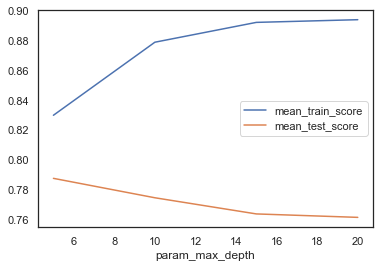

In [109]:
#Grouping on parameter max_depth and checking the roc_auc_score for it

cv_df.groupby('param_max_depth')['mean_train_score', 'mean_test_score'].mean().plot()
plt.show()

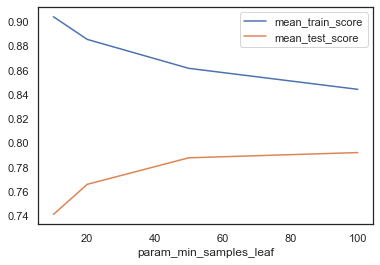

In [110]:
#Grouping on parameter min_samples_leaf and checking the roc_auc_score for it

cv_df.groupby('param_min_samples_leaf')['mean_train_score', 'mean_test_score'].mean().plot()
plt.show()

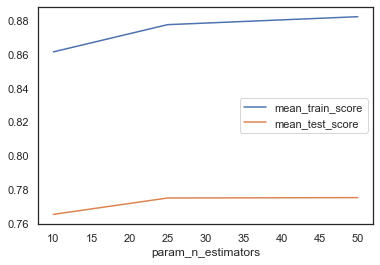

In [111]:
#Grouping on parameter n_estimators and checking the roc_auc_score for it

cv_df.groupby('param_n_estimators')['mean_train_score', 'mean_test_score'].mean().plot()
plt.show()

### Model 4: Ridge Classifier with PCA and SMOTE Balanced Dataset

In [112]:
ridge = RidgeClassifier(random_state=100)

params = {'alpha': [1e-2, 5, 10, 20, 50, 70, 90, 100, 1000] }

In [113]:
ridge_grid = GridSearchCV(ridge, param_grid=params, cv=5, verbose=1, n_jobs=-1, return_train_score=True, 
                          scoring='roc_auc')

In [114]:
ridge_grid.fit(X_train_pca_smo, y_train_smo)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    2.7s finished


GridSearchCV(cv=5, estimator=RidgeClassifier(random_state=100), n_jobs=-1,
             param_grid={'alpha': [0.01, 5, 10, 20, 50, 70, 90, 100, 1000]},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [115]:
ridge_grid.best_estimator_

RidgeClassifier(alpha=0.01, random_state=100)

In [116]:
ridge_grid.best_score_

0.9122414912127474

In [117]:
best_ridge = ridge_grid.best_estimator_

In [118]:
best_ridge.fit(X_train_pca_smo, y_train_smo)

RidgeClassifier(alpha=0.01, random_state=100)

In [119]:
print("Train Accuracy :", round(accuracy_score(y_train_smo, best_ridge.predict(X_train_pca_smo)), 2))
con_matrix = confusion_matrix(y_train_smo, best_ridge.predict(X_train_pca_smo))
sensitivity=con_matrix[1,1]/(con_matrix[1,0]+con_matrix[1,1])
specificity=con_matrix[0,0]/(con_matrix[0,0]+con_matrix[0,1])
print("Train Confusion Matrix:")
print(con_matrix)
print("Train Sensitivity :", round(sensitivity, 2))
print("Train Specificity :", round(sensitivity, 2))

print("-"*75)

print("Test Accuracy :", round(accuracy_score(y_test, best_ridge.predict(X_test_pca_smo)),2))
con_matrix = confusion_matrix(y_test, best_ridge.predict(X_test_pca_smo))
sensitivity=con_matrix[1,1]/(con_matrix[1,0]+con_matrix[1,1])
specificity=con_matrix[0,0]/(con_matrix[0,0]+con_matrix[0,1])
print("Test Confusion Matrix:")
print(con_matrix)
print("Test Sensitivity:", round(sensitivity,2))
print("Test Specificity:", round(specificity,2))

Train Accuracy : 0.85
Train Confusion Matrix:
[[15699  3493]
 [ 2321 16871]]
Train Sensitivity : 0.88
Train Specificity : 0.88
---------------------------------------------------------------------------
Test Accuracy : 0.82
Test Confusion Matrix:
[[6715 1511]
 [ 136  642]]
Test Sensitivity: 0.83
Test Specificity: 0.82


**`OBSERVATIONS of RIDGE Classifier:`**

- The model performance is good with the Train Metrics and the Test Metrics differing by 0.3, and Sensitivity is also 0.83, indicating that it is able to identify 83% of the customers planning to Churn.

#### BEST MODEL:
- From the above 4 models, we observe that **Logistic Regression with PCA and class_weight='balanced'** gives the highest performance and is a robust model, since Train and Test's Accuracy, ROC-AUC score are high with just 0.1 difference, and Sensitivity is 84% indicating that it is able to identify 84% of the customers planning to Churn.


## 9. Building an Interpretable model using Decision Tree

In [120]:
dt = DecisionTreeClassifier(random_state=100, class_weight='balanced')

params = {
    
    'min_samples_split' : [5, 15, 20, 50, 100, 200],
    'max_depth': [5, 10, 15, 20, 25],
    'min_samples_leaf': [5, 10, 15, 25],
    'max_features': [2,4,6],
}

scorer = make_scorer(roc_auc_score, greater_is_better=True)

In [121]:
gridsearchcv = GridSearchCV(estimator=dt , param_grid=params, scoring=scorer, n_jobs=-1, 
                            verbose=True, return_train_score=True, cv=4)

gridsearchcv.fit(X_train, y_train)

Fitting 4 folds for each of 360 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   32.6s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   51.1s
[Parallel(n_jobs=-1)]: Done 1440 out of 1440 | elapsed:   59.9s finished


GridSearchCV(cv=4,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=100),
             n_jobs=-1,
             param_grid={'max_depth': [5, 10, 15, 20, 25],
                         'max_features': [2, 4, 6],
                         'min_samples_leaf': [5, 10, 15, 25],
                         'min_samples_split': [5, 15, 20, 50, 100, 200]},
             return_train_score=True, scoring=make_scorer(roc_auc_score),
             verbose=True)

In [122]:
#Checking best params

gridsearchcv.best_params_

{'max_depth': 20,
 'max_features': 6,
 'min_samples_leaf': 10,
 'min_samples_split': 200}

In [123]:
#Checking best parameter

gridsearchcv.best_estimator_

DecisionTreeClassifier(class_weight='balanced', max_depth=20, max_features=6,
                       min_samples_leaf=10, min_samples_split=200,
                       random_state=100)

In [124]:
best_dt = gridsearchcv.best_estimator_

In [125]:
evaluate_pca_model(best_dt, X_train, y_train, X_test)

Train Accuracy : 0.83
Train ROC AUC Score : 0.93
Train Confusion Matrix:
[[15768  3424]
 [  232  1583]]
Train Sensitivity : 0.87
Train Specificity : 0.87
Train Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.82      0.90     19192
           1       0.32      0.87      0.46      1815

    accuracy                           0.83     21007
   macro avg       0.65      0.85      0.68     21007
weighted avg       0.93      0.83      0.86     21007

---------------------------------------------------------------------------
Test Accuracy : 0.8
Test ROC AUC Score : 0.87
Test Confusion Matrix:
[[6646 1580]
 [ 176  602]]
Test Sensitivity : 0.77
Test Specificity : 0.77
Test Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.81      0.88      8226
           1       0.28      0.77      0.41       778

    accuracy                           0.80      9004
   macro avg       0.63 

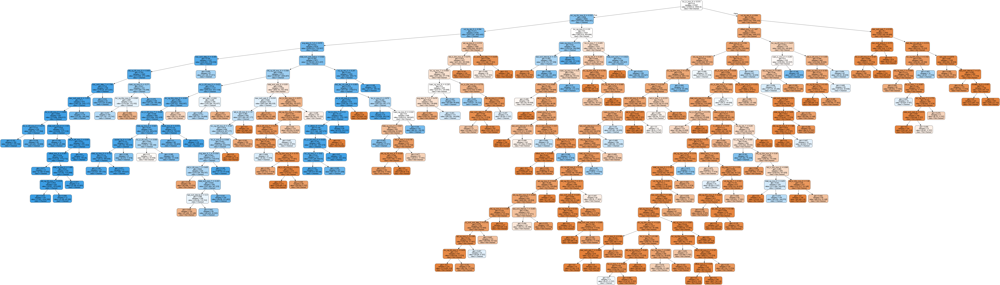

In [126]:
#Plotting the Decision Tree for Interpretation

dot_data = StringIO()

export_graphviz(best_dt, out_file=dot_data, filled=True, rounded=True, feature_names=X_train.columns, class_names=['Not Churned', 'Churned'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [127]:
imp_features = pd.DataFrame({'features': X_train.columns, 'importance': best_dt.feature_importances_ * 100})

In [128]:
imp_features.sort_values(by='importance', ascending=False).head(10)

,features,importance
60,loc_ic_mou_8,48.29
108,vol_3g_mb_8,6.20
29,std_og_t2t_mou_8,4.65
23,loc_og_t2c_mou_8,3.50
11,roam_og_mou_8,3.40
126,last_rech_interval_8,2.49
129,avg_arpu_6_7_8,2.13
8,roam_ic_mou_8,2.08
128,total_rech_amt_reduce,1.84
90,last_day_rch_amt_8,1.48


### From the above Decision Tree Graph and the Top 10 Important Features table we observe that the most important predictors for Churn are:
- Local incoming calls minutes of usage in August
- Volume of 3g data consumed in August
- STD outgoing calls within the same operator minutes of usage in August
- Local outgoing calls to Customer Care in August
- Roaming outgoing/incoming calls minutes of usage in August
- The last recharge interval in August
- The average revenue of the user in the last 3 months - June, July, August
- Total recharge amount reduce in the last 3 months - June, July, August
- The last day recharge amount in August

## Recommended Strategies for Identifying Churn
The company can check,
- If there is any significant decrease in the outgoing or incoming calls, and the volume of 2g or 3g data consumed. If so, it can indicate that the customer is planning to switch to another provider.
- If there is a significant increase in local outgoing calls to the Customer care, it can indicate that the customer is facing many issues with the Teleprovider and can lead to customer dissatisfaction, inturn resulting in churn.
- If there is a significant increase in the roaming outgoing calls, then it can indicate that the customer is moving to a different place, and can plan on switching to the best provider in that location.
- If there is a significant decrease in the average revenue generated by the user in the past 3 months, it can indicate that the customer is planning to switch to another provider.
- If the customer is recharging for a very small amount on the last day of the month or does not recharge for almost one full month, then it can indicate that the customer is planning to switch to another provider.
- If the customer's age on network is less than 2 years, then their probability of switching to another service provider is high.

<br>

**Based on the above checks, the company can decide if the Customer is going to Churn or not.**
